In [134]:
#Importing Libraries
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

In [135]:
#Importing data
data=pd.read_csv("C:/Users/DC/Downloads/Automobile_insurance_fraud.csv",parse_dates=['policy_bind_date','incident_date'])
df=pd.DataFrame(data)
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,2000-06-09,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,1991-07-16,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,2014-05-01,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,2003-02-17,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,2011-11-18,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


DATA CLEANING

In [136]:
df.dtypes

months_as_customer                      int64
age                                     int64
policy_number                           int64
policy_bind_date               datetime64[ns]
policy_state                           object
policy_csl                             object
policy_deductable                       int64
policy_annual_premium                 float64
umbrella_limit                          int64
insured_zip                             int64
insured_sex                            object
insured_education_level                object
insured_occupation                     object
insured_hobbies                        object
insured_relationship                   object
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                          object
collision_type                         object
incident_severity                      object
authorities_contacted             

In [137]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [138]:
df['police_report_available']=df['police_report_available'].replace('?',np.NaN)

In [139]:
df['property_damage']=df['property_damage'].replace('?',np.NaN)

In [140]:
df['collision_type']=df['collision_type'].replace('?',np.NaN)

In [141]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                  178
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [142]:
#Dropping _c39
df.drop(['_c39'],axis=1,inplace=True)

In [143]:
df['incident_location'].unique()

array(['9935 4th Drive', '6608 MLK Hwy', '7121 Francis Lane',
       '6956 Maple Drive', '3041 3rd Ave', '8973 Washington St',
       '5846 Weaver Drive', '3525 3rd Hwy', '4872 Rock Ridge',
       '3066 Francis Ave', '1558 1st Ridge', '5971 5th Hwy',
       '6655 5th Drive', '6582 Elm Lane', '6851 3rd Drive',
       '9573 Weaver Ave', '5074 3rd St', '4546 Tree St',
       '3842 Solo Ridge', '8101 3rd Ridge', '5380 Pine St',
       '8957 Weaver Drive', '2526 Embaracadero Ave', '5667 4th Drive',
       '2502 Apache Hwy', '3418 Texas Lane', '2533 Elm St',
       '3790 Andromedia Hwy', '3220 Rock Drive', '2100 Francis Drive',
       '4687 5th Drive', '9038 2nd Lane', '6092 5th Ave',
       '8353 Britain Ridge', '3540 Maple St', '3104 Sky Drive',
       '4981 Weaver St', '6676 Tree Lane', '3930 Embaracadero St',
       '3422 Flute St', '4862 Lincoln Hwy', '5719 2nd Lane',
       '3221 Solo Ridge', '6660 MLK Drive', '1699 Oak Drive',
       '4234 Cherokee Lane', '7476 4th St', '8907 Tree Ave

In [144]:
df['incident_city'].unique()

array(['Columbus', 'Riverwood', 'Arlington', 'Springfield', 'Hillsdale',
       'Northbend', 'Northbrook'], dtype=object)

In [145]:
df['incident_state'].unique()

array(['SC', 'VA', 'NY', 'OH', 'WV', 'NC', 'PA'], dtype=object)

In [146]:
df['auto_make'].unique()

array(['Saab', 'Mercedes', 'Dodge', 'Chevrolet', 'Accura', 'Nissan',
       'Audi', 'Toyota', 'Ford', 'Suburu', 'BMW', 'Jeep', 'Honda',
       'Volkswagen'], dtype=object)

In [147]:
df['auto_model'].unique()

array(['92x', 'E400', 'RAM', 'Tahoe', 'RSX', '95', 'Pathfinder', 'A5',
       'Camry', 'F150', 'A3', 'Highlander', 'Neon', 'MDX', 'Maxima',
       'Legacy', 'TL', 'Impreza', 'Forrestor', 'Escape', 'Corolla',
       '3 Series', 'C300', 'Wrangler', 'M5', 'X5', 'Civic', 'Passat',
       'Silverado', 'CRV', '93', 'Accord', 'X6', 'Malibu', 'Fusion',
       'Jetta', 'ML350', 'Ultima', 'Grand Cherokee'], dtype=object)

In [148]:
df['auto_year'].unique()

array([2004, 2007, 2014, 2009, 2003, 2012, 2015, 1996, 2002, 2006, 2000,
       2010, 1999, 2011, 2005, 2008, 1995, 2001, 1998, 1997, 2013],
      dtype=int64)

In [149]:
df['auto_year']=df['auto_year'].astype(int)

In [150]:
df.drop(['incident_location'],axis=1,inplace=True)
df.drop(['policy_number'],axis=1,inplace=True)

In [151]:
#Separating year from date
df['policy_bind_year']=df['policy_bind_date'].dt.year
df['incident_year']=df['incident_date'].dt.year

In [152]:
df['policy_bind_year']=df['policy_bind_year'].astype(int)
df['incident_year']=df['incident_year'].astype(int)

In [153]:
#Creating policy age
df['policy_age']=df['incident_year']-df['policy_bind_year']
df.drop(['incident_year'],axis=1,inplace=True)

In [154]:
df.drop(['policy_bind_date'],axis=1,inplace=True)
df.drop(['incident_date'],axis=1,inplace=True)

In [155]:
#Separating policy csl
df['policy_csl_per_person']=df['policy_csl'].str.split('/').str[0]
df['policy_csl_max']=df['policy_csl'].str.split('/').str[1]
df.drop(['policy_csl'],axis=1,inplace=True)

In [156]:
df['policy_csl_per_person']=df['policy_csl_per_person'].astype(int)
df['policy_csl_max']=df['policy_csl_max'].astype(int)

In [157]:
#Filling na values
df.fillna('UNKNOWN',inplace=True)

In [158]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_state                   0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_claim                 0
vehicle_claim                  0
auto_make 

In [159]:
df

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,...,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_year,policy_age,policy_csl_per_person,policy_csl_max
0,328,48,OH,1000,1406.91,0,466132,MALE,MD,craft-repair,...,13020,52080,Saab,92x,2004,Y,2014,1,250,500
1,228,42,IN,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,...,780,3510,Mercedes,E400,2007,Y,2006,9,250,500
2,134,29,OH,2000,1413.14,5000000,430632,FEMALE,PhD,sales,...,3850,23100,Dodge,RAM,2007,N,2000,15,100,300
3,256,41,IL,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,...,6340,50720,Chevrolet,Tahoe,2014,Y,1990,25,250,500
4,228,44,IL,1000,1583.91,6000000,610706,MALE,Associate,sales,...,650,4550,Accura,RSX,2009,N,2014,1,500,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,...,8720,61040,Honda,Accord,2006,N,1991,24,500,1000
996,285,41,IL,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,...,18080,72320,Volkswagen,Passat,2015,N,2014,1,100,300
997,130,34,OH,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,...,7500,52500,Suburu,Impreza,1996,N,2003,12,250,500
998,458,62,IL,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,...,5220,36540,Audi,A5,1998,N,2011,4,500,1000


In [160]:
df.dtypes

months_as_customer               int64
age                              int64
policy_state                    object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries                  int64
witnesses                        int64
police_report_available  

In [161]:
#LabelEncoder to change object variables to int
import sklearn
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
for i in df.columns:
    if df[i].dtypes=='O':
        df[i]=le.fit_transform(df[i].astype(str))
df

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,...,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_year,policy_age,policy_csl_per_person,policy_csl_max
0,328,48,2,1000,1406.91,0,466132,1,4,2,...,13020,52080,10,1,2004,1,2014,1,250,500
1,228,42,1,2000,1197.22,5000000,468176,1,4,6,...,780,3510,8,12,2007,1,2006,9,250,500
2,134,29,2,2000,1413.14,5000000,430632,0,6,11,...,3850,23100,4,30,2007,0,2000,15,100,300
3,256,41,0,2000,1415.74,6000000,608117,0,6,1,...,6340,50720,3,34,2014,1,1990,25,250,500
4,228,44,0,1000,1583.91,6000000,610706,1,0,11,...,650,4550,0,31,2009,0,2014,1,500,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,1000,1310.80,0,431289,0,5,2,...,8720,61040,6,6,2006,0,1991,24,500,1000
996,285,41,0,1000,1436.79,0,608177,0,6,9,...,18080,72320,13,28,2015,0,2014,1,100,300
997,130,34,2,500,1383.49,3000000,442797,0,5,1,...,7500,52500,11,19,1996,0,2003,12,250,500
998,458,62,0,2000,1356.92,5000000,441714,1,0,5,...,5220,36540,1,5,1998,0,2011,4,500,1000


In [162]:
df.describe()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,...,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_year,policy_age,policy_csl_per_person,policy_csl_max
count,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1.01400,1136.000000,1256.406150,1.101000e+06,501214.488000,0.463000,2.966000,6.653000,...,7399.570000,37928.950000,6.546000,19.318000,2005.103000,0.247000,2001.604000,13.396000,272.650000,580.200000
std,115.113174,9.140287,0.83096,611.864673,244.167395,2.297407e+06,71701.610941,0.498879,1.948497,4.019048,...,4824.726179,18886.252893,4.034869,11.136107,6.015861,0.431483,7.360391,7.360391,161.603196,287.420547
min,0.000000,19.000000,0.00000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,0.000000,0.000000,...,0.000000,70.000000,0.000000,0.000000,1995.000000,0.000000,1990.000000,0.000000,100.000000,300.000000
25%,115.750000,32.000000,0.00000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,1.000000,3.000000,...,4445.000000,30292.500000,3.000000,10.000000,2000.000000,0.000000,1995.000000,7.000000,100.000000,300.000000
50%,199.500000,38.000000,1.00000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,3.000000,7.000000,...,6750.000000,42100.000000,7.000000,20.000000,2005.000000,0.000000,2002.000000,13.000000,250.000000,500.000000
75%,276.250000,44.000000,2.00000,2000.000000,1415.695000,0.000000e+00,603251.000000,1.000000,5.000000,10.000000,...,10885.000000,50822.500000,10.000000,29.000000,2010.000000,0.000000,2008.000000,20.000000,500.000000,1000.000000
max,479.000000,64.000000,2.00000,2000.000000,2047.590000,1.000000e+07,620962.000000,1.000000,6.000000,13.000000,...,23670.000000,79560.000000,13.000000,38.000000,2015.000000,1.000000,2015.000000,25.000000,500.000000,1000.000000


Skewness and outliers may be present in some columns

In [164]:
#Outliers check and treatment 
from scipy.stats import zscore 
threhold=3 
z=np.abs(zscore(df)) 
print(np.where(z>3))

(array([ 31,  48,  88, 115, 119, 229, 248, 262, 314, 430, 458, 500, 503,
       657, 700, 763, 807, 875, 922, 975], dtype=int64), array([ 5,  5,  5,  5,  5,  4,  4,  5,  5,  5,  5, 28,  5,  5,  5,  4, 13,
        5,  5,  5], dtype=int64))


In [165]:
df=df[(z<3).all(axis=1)]
df

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,...,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_year,policy_age,policy_csl_per_person,policy_csl_max
0,328,48,2,1000,1406.91,0,466132,1,4,2,...,13020,52080,10,1,2004,1,2014,1,250,500
1,228,42,1,2000,1197.22,5000000,468176,1,4,6,...,780,3510,8,12,2007,1,2006,9,250,500
2,134,29,2,2000,1413.14,5000000,430632,0,6,11,...,3850,23100,4,30,2007,0,2000,15,100,300
3,256,41,0,2000,1415.74,6000000,608117,0,6,1,...,6340,50720,3,34,2014,1,1990,25,250,500
4,228,44,0,1000,1583.91,6000000,610706,1,0,11,...,650,4550,0,31,2009,0,2014,1,500,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,1000,1310.80,0,431289,0,5,2,...,8720,61040,6,6,2006,0,1991,24,500,1000
996,285,41,0,1000,1436.79,0,608177,0,6,9,...,18080,72320,13,28,2015,0,2014,1,100,300
997,130,34,2,500,1383.49,3000000,442797,0,5,1,...,7500,52500,11,19,1996,0,2003,12,250,500
998,458,62,0,2000,1356.92,5000000,441714,1,0,5,...,5220,36540,1,5,1998,0,2011,4,500,1000


In [189]:
import matplotlib.pyplot as plt
import seaborn as sns

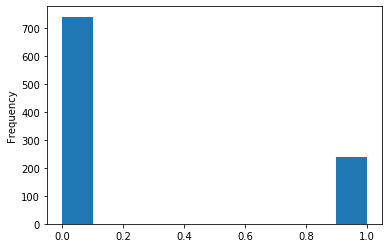

In [198]:
plt.figure()
df['fraud_reported'].plot(kind='hist')

fraud reported 0 has the highest frequency

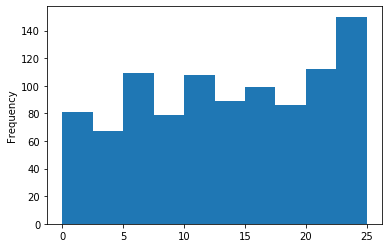

In [199]:
plt.figure()
df['policy_age'].plot(kind='hist')

policy age=24(approx) has the highest frequency

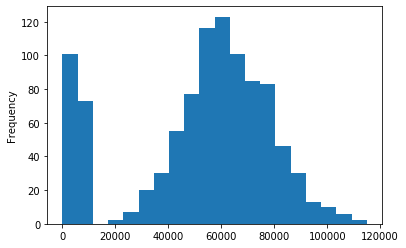

In [201]:
plt.figure()
df['total_claim_amount'].plot(kind='hist',bins=20)

total claim amount=60000(approx) has the highest frequency

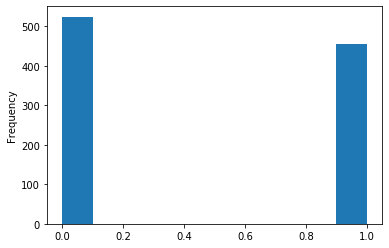

In [202]:
plt.figure()
df['insured_sex'].plot(kind='hist')

insured sex=0 has the highest frequency

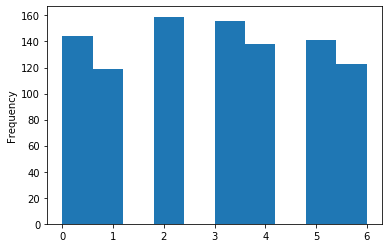

In [203]:
plt.figure()
df['insured_education_level'].plot(kind='hist')

insured education level =2 has the highest frequency

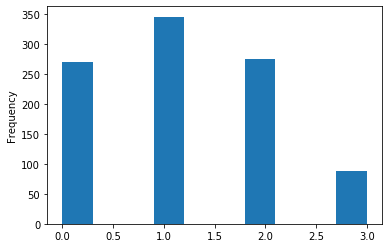

In [204]:
plt.figure()
df['incident_severity'].plot(kind='hist')

incident severity=1 has the highest frequency

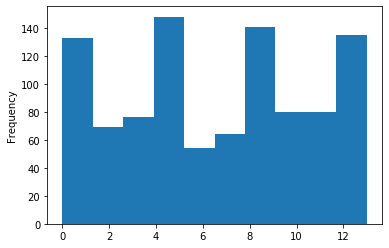

In [205]:
plt.figure()
df['auto_make'].plot(kind='hist')

auto make=4 has the highest frequency

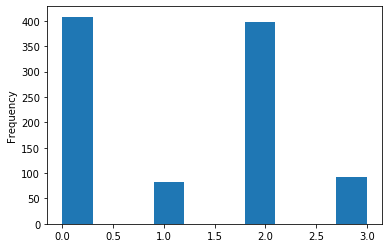

In [206]:
plt.figure()
df['incident_type'].plot(kind='hist')

incident type=0 has the highest frequency

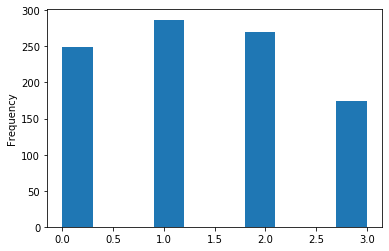

In [207]:
plt.figure()
df['collision_type'].plot(kind='hist')

collision type=1 has the highest frequency

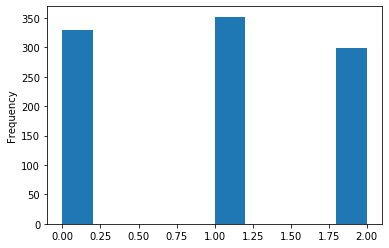

In [208]:
plt.figure()
df['property_damage'].plot(kind='hist')

property damage=1 has the highest frequency

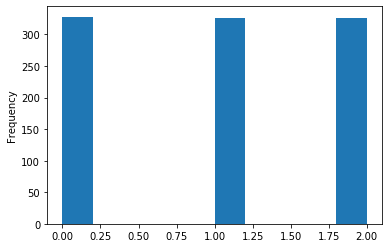

In [210]:
plt.figure()
df['bodily_injuries'].plot(kind='hist')

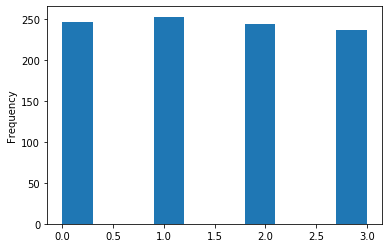

In [211]:
plt.figure()
df['witnesses'].plot(kind='hist')

witnesses=1 has the highest frequency

<Figure size 432x288 with 0 Axes>

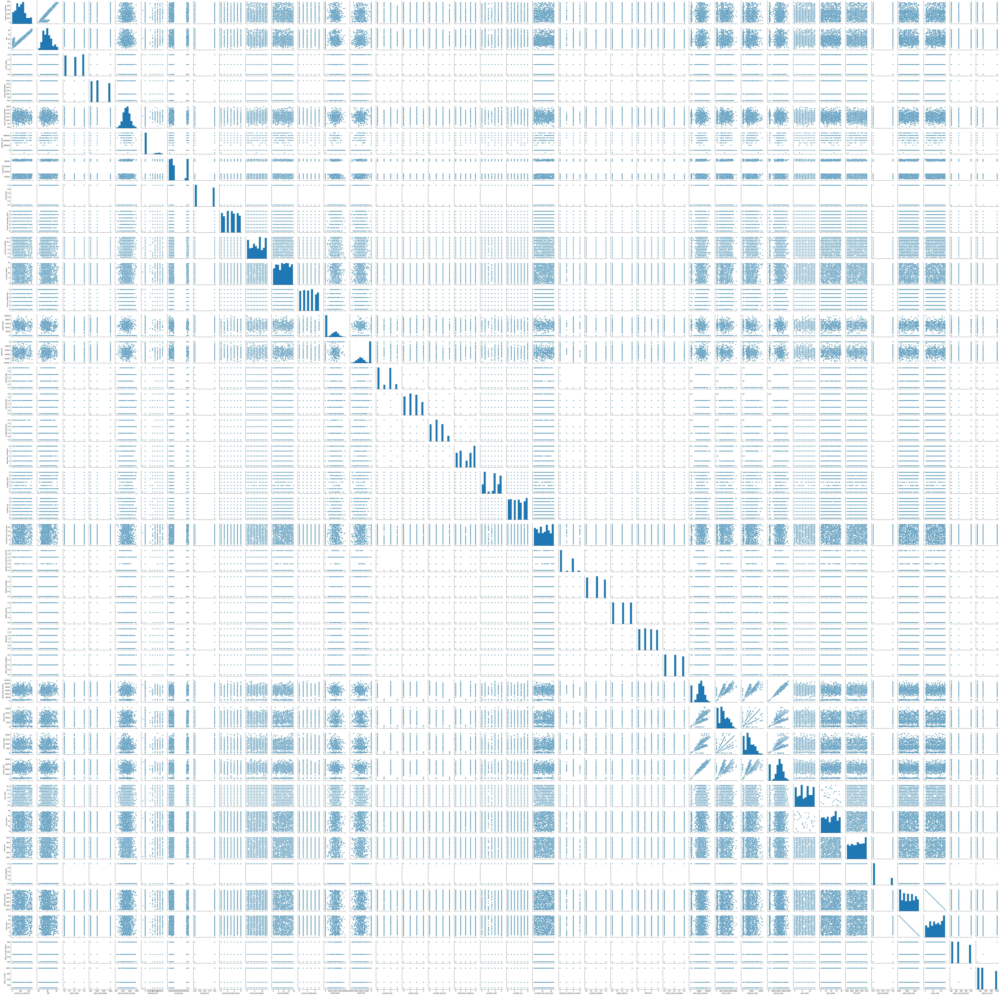

In [194]:
plt.figure()
sns.pairplot(df)

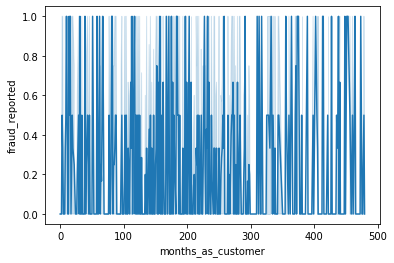

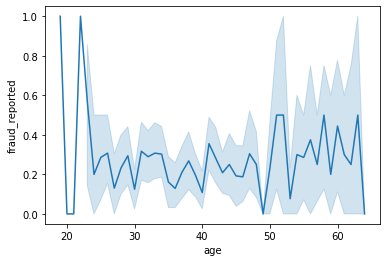

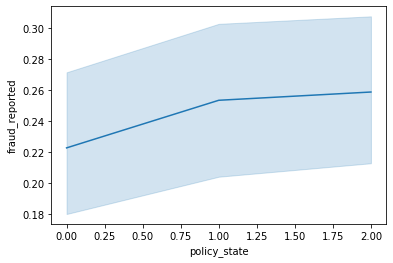

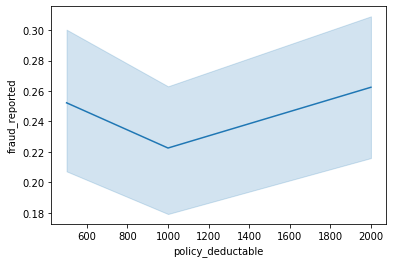

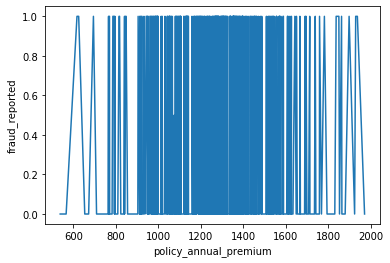

...

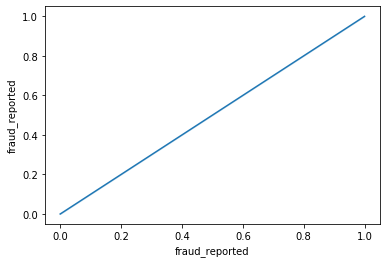

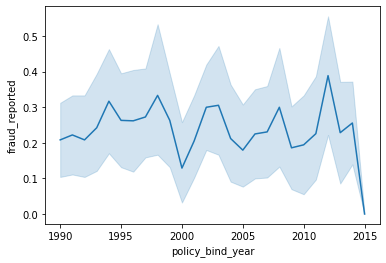

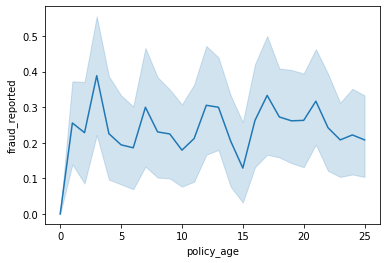

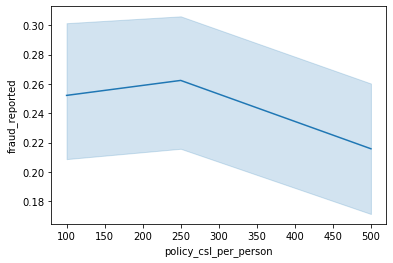

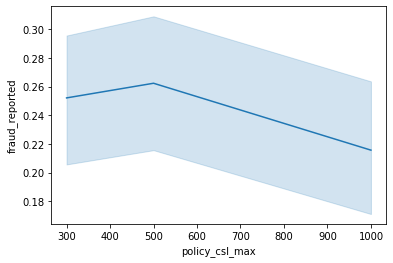

In [195]:
for i in df.columns:
    plt.figure()
    sns.lineplot(i,'fraud_reported',data=df)

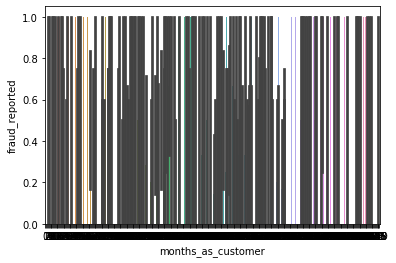

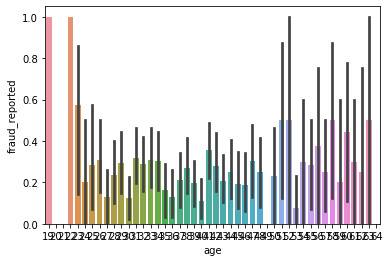

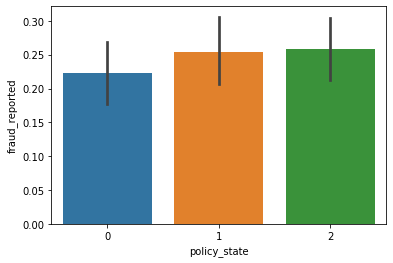

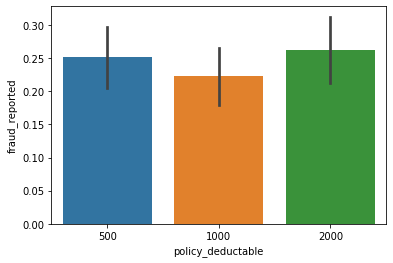

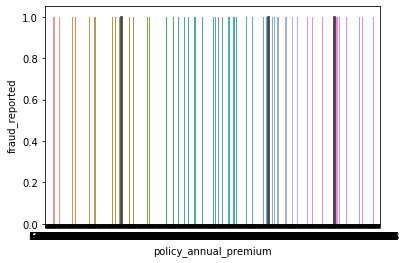

...

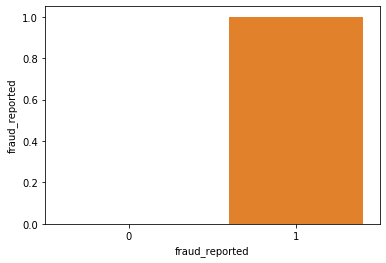

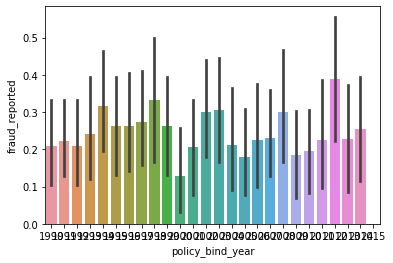

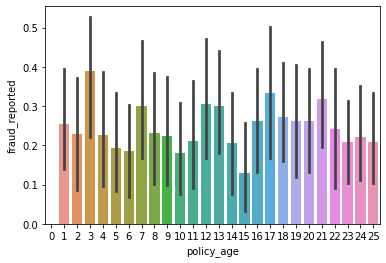

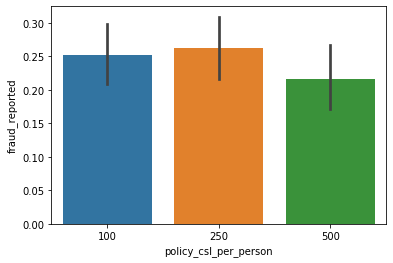

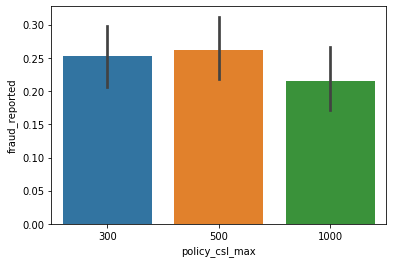

In [196]:
for i in df.columns:
    plt.figure()
    sns.barplot(i,'fraud_reported',data=df)

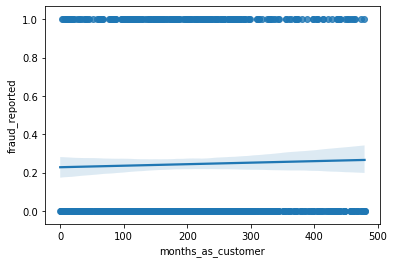

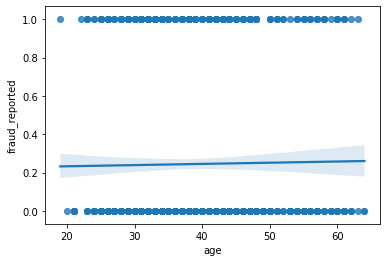

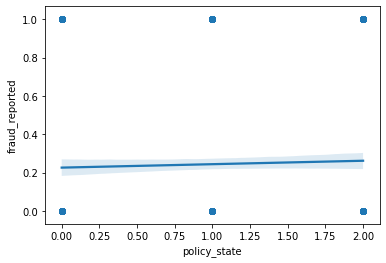

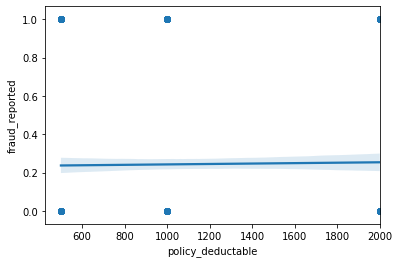

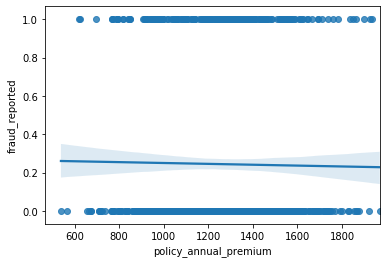

...

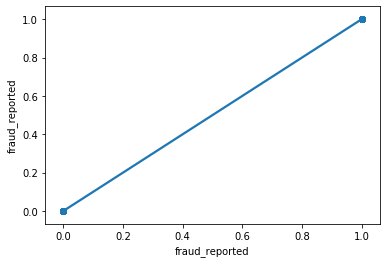

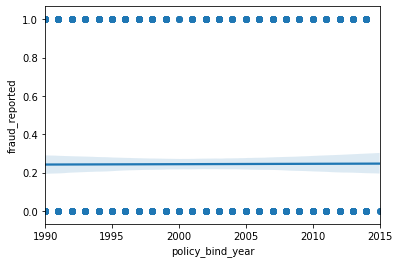

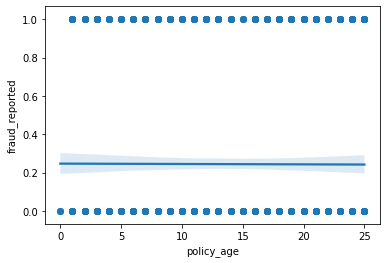

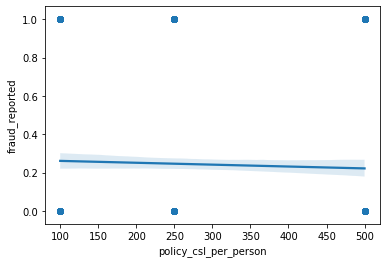

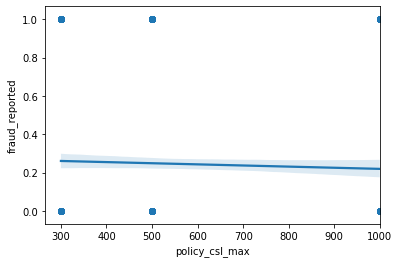

In [197]:
for i in df.columns:
    plt.figure()
    sns.regplot(i,'fraud_reported',data=df)

Fraud reported increases with increase in months as customer,age,policy deductable,umbrella limit,insured zip, insured education level,number of vehicles involved,witnesses, total claim amount, injury claim, property claim and vehicle claim. policy csl max=500 has the highest fraud reported and 1000 has the lowest. policy csl per person=250 has the highest fraud reported and 500 has the lowest.policy age=3 has the highest fraud reported and 15 has the lowest.automake=8 has the highest fraud reported and 7 has the lowest.police report available=1 has the highest fraud reported.witnesses=2 has the highest fraud reported and 0 has the lowest.bodily injuries 2 has the highest fraud reported and 0 has the lowest.property damage 1 has the highest fraud reported and 0 has the lowest.incident city 0 has the highest fraud reported and 5 has the lowest.incident state 2 has the highest fraud reported and 6 has the lowest.authorities contacted 3 has the highest fraud reported and 2 has the lowest.incident severity 0 has the highest fraud reported and 3 has the lowest.collision type 1 has the highest fraud reported and 3 has the lowest.incident type 2 has the highest fraud reported and 3 has the lowest.insured relationship 2 has the highest fraud reported and 0 has the lowest. insured hobbies 5 has the highest fraud reported and 11 has the lowest. insured occupation 3 has the highest fraud reported and 0 has the lowest.insured education level 6 has the highest fraud reported and 2 has the lowest. insured sex 1 has the highest fraud reported. policy state 2 has the highest fraud reported and 0 has the lowest.

In [166]:
#X y division of data
x=df.drop(['fraud_reported'],axis=1)
y=df['fraud_reported']
y=y.values.reshape(-1,1)
y.shape

(980, 1)

In [167]:
#scaling the data
import sklearn
from sklearn.preprocessing import StandardScaler
scale=StandardScaler()
dx=scale.fit_transform(x)
x=pd.DataFrame(dx,columns=x.columns)
x

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,policy_bind_year,policy_age,policy_csl_per_person,policy_csl_max
0,1.069568,0.983352,1.179821,-0.224643,0.620031,-0.467878,-0.484014,1.071971,0.532901,-1.156087,...,-0.187627,1.176015,0.753824,0.851959,-1.640447,-0.188594,1.683157,-1.683157,-0.134288,-0.273720
1,0.202726,0.329711,-0.024580,1.412161,-0.248448,1.890767,-0.455363,1.071971,0.532901,-0.160292,...,-1.361005,-1.378984,-1.824679,0.355279,-0.651740,0.310476,0.600279,-0.600279,-0.134288,-0.273720
2,-0.612105,-1.086511,1.179821,1.412161,0.645834,1.890767,-0.981629,-0.932861,1.556905,1.084451,...,0.056059,-0.738147,-0.784678,-0.638083,0.966145,0.310476,-0.211879,0.211879,-1.063242,-0.970462
3,0.445442,0.220771,-1.228980,1.412161,0.656603,2.362496,1.506233,-0.932861,1.556905,-1.405036,...,-0.222439,-0.218380,0.681623,-0.886423,1.325675,1.474975,-1.565477,1.565477,-0.134288,-0.273720
4,0.202726,0.547591,-1.228980,-0.224643,1.353117,2.362496,1.542524,1.071971,-1.515109,1.084451,...,-1.254521,-1.406121,-1.769467,-1.631444,1.056027,0.643190,1.683157,-1.683157,1.413969,1.468134
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
975,-1.747669,-0.106050,1.179821,-0.224643,0.221970,-0.467878,-0.972419,-0.932861,1.044903,-1.156087,...,2.050597,0.278425,1.229496,-0.141402,-1.191035,0.144119,-1.430118,1.430118,1.413969,1.468134
976,0.696826,0.220771,-1.228980,-0.224643,0.743786,-0.467878,1.507074,-0.932861,1.556905,0.586554,...,2.181655,2.232248,1.828332,1.596980,0.786380,1.641332,1.683157,-1.683157,-1.063242,-0.970462
977,-0.646779,-0.541810,1.179821,-1.043045,0.523032,0.947309,-0.811108,-0.932861,1.044903,-1.405036,...,0.015103,0.023760,0.776121,1.100300,-0.022562,-1.519450,0.194200,-0.194200,-0.134288,-0.273720
978,2.196463,2.508513,-1.228980,1.412161,0.412986,1.890767,-0.826289,1.071971,-1.515109,-0.409241,...,-0.451791,-0.452171,-0.071170,-1.383104,-1.280917,-1.186736,1.277078,-1.277078,1.413969,1.468134


In [168]:
#Importing Libraries
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,roc_curve,auc
from sklearn.model_selection import cross_val_score

In [169]:
# getting the best random state for train test split
def max_score(model):
    max_score=0
    for r_state in range(42,100):
        xtrain,xtest,ytrain,ytest=train_test_split(x,y,random_state=r_state,test_size=0.20)
        model.fit(xtrain,ytrain)
        ypred=model.predict(xtest)
        accuracy=accuracy_score(ytest,ypred)
        if accuracy>max_score:
            max_score=accuracy
            final_r_state=r_state
    print(max_score,'is max accuracy against r_state',final_r_state)

In [170]:
logr=LogisticRegression()
max_score(logr)

0.8214285714285714 is max accuracy against r_state 68


In [172]:
#finding best parameters for knn
algo=KNeighborsClassifier()
para={'n_neighbors':[3,5,7,9,11]}
grid=GridSearchCV(estimator=algo,param_grid=para)
grid.fit(x,y)

print(grid.best_params_)

{'n_neighbors': 7}


In [174]:
knc=KNeighborsClassifier(n_neighbors=7)
max_score(knc)

0.8010204081632653 is max accuracy against r_state 51


In [175]:
algo=SVC()
para={'kernel':['rbf','poly','linear'],'C':[1,10]}
grid=GridSearchCV(estimator=algo,param_grid=para)
grid.fit(x,y)

print(grid.best_params_)

{'C': 1, 'kernel': 'linear'}


In [176]:
svc=SVC(C= 1, kernel= 'linear')
max_score(svc)

0.826530612244898 is max accuracy against r_state 59


In [177]:
algo=DecisionTreeClassifier()
para={'criterion':['gini','entropy']}
grid=GridSearchCV(estimator=algo,param_grid=para)
grid.fit(x,y)

print(grid.best_params_)

{'criterion': 'gini'}


In [178]:
dtc=DecisionTreeClassifier(criterion='gini')
max_score(dtc)

0.8418367346938775 is max accuracy against r_state 45


In [179]:
algo=RandomForestClassifier()
para={'n_estimators':[50,100,150,200,500]}
grid=GridSearchCV(estimator=algo,param_grid=para)
grid.fit(x,y)

print(grid.best_params_)

{'n_estimators': 100}


In [180]:
rfc=RandomForestClassifier(n_estimators=100)
max_score(rfc)

0.8214285714285714 is max accuracy against r_state 58


In [181]:
#using Boosting to improve accuracy
from sklearn.ensemble import AdaBoostClassifier,GradientBoostingClassifier

In [182]:
algo=GradientBoostingClassifier()
para={'learning_rate':[1,0.1,0.01,0.001,0]}
grid=GridSearchCV(estimator=algo,param_grid=para)
grid.fit(x,y)

print(grid.best_params_)

{'learning_rate': 0.1}


In [183]:
gdb=GradientBoostingClassifier(learning_rate=0.1)
max_score(gdb)

0.8571428571428571 is max accuracy against r_state 69


In [185]:
algo=AdaBoostClassifier()
para={'n_estimators':[50,100,150,200,500],'base_estimator':[logr,knc,svc,dtc,rfc]}
grid=GridSearchCV(estimator=algo,param_grid=para)
grid.fit(x,y)

print(grid.best_params_)

{'base_estimator': RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False), 'n_estimators': 50}


In [186]:
ad=AdaBoostClassifier(n_estimators=50,base_estimator=rfc,algorithm='SAMME')
max_score(ad)

0.8214285714285714 is max accuracy against r_state 84


In [190]:
models=[]
models.append(('Logistic Regression',logr,68))
models.append(('Support Vector Classifier',svc,59))
models.append(('KNeighborsClassifier',knc,51))
models.append(('Decision tree Classifier',dtc,45))
models.append(('RandomForest Classifier',rfc,58))
models.append(('AdaBoost Classifier',ad,84))
models.append(('Gradient Boosting Classifier',gdb,69))

Models=[]
Accuracy=[]
Cvs=[]
Roc_score=[]

*********** Logistic Regression ************


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


Accuracy score= 0.8214285714285714


Cross Validation Score= 0.7755102040816327


              precision    recall  f1-score   support

           0       0.91      0.88      0.89       163
           1       0.47      0.55      0.51        33

    accuracy                           0.82       196
   macro avg       0.69      0.71      0.70       196
weighted avg       0.83      0.82      0.83       196



[[143  20]
 [ 15  18]]
Roc score= 0.711377579475739


AxesSubplot(0.125,0.808774;0.62x0.0712264)



*********** Support Vector Classifier ************


SVC(C=1, break_ties=False, cache_size=200, class_weight=None,

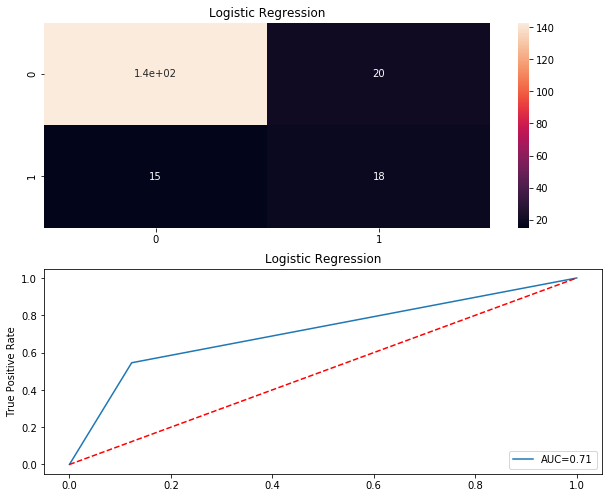

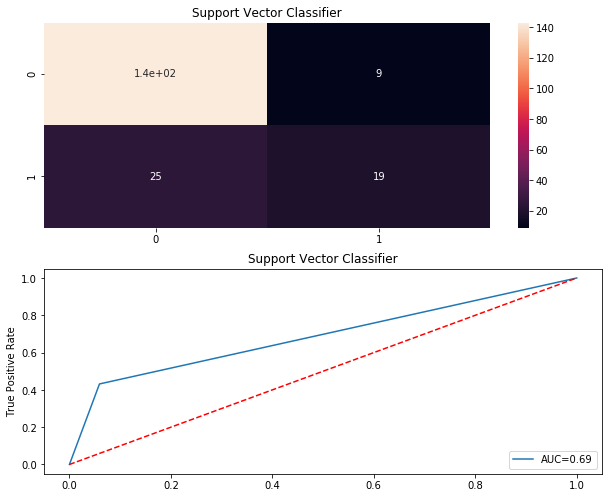

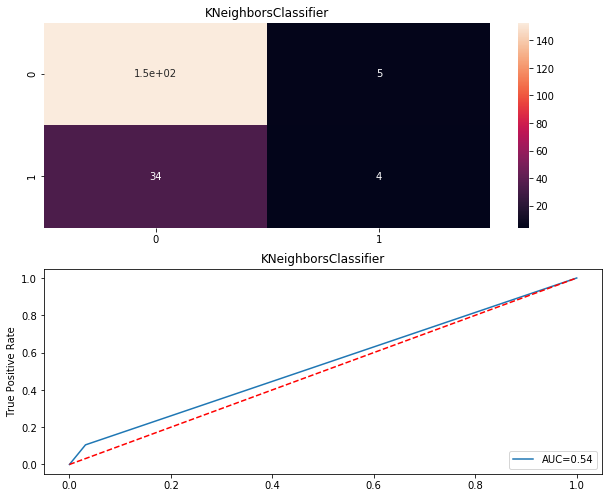

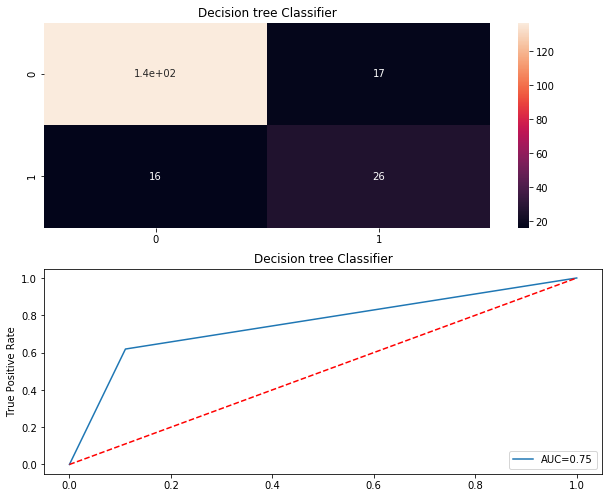

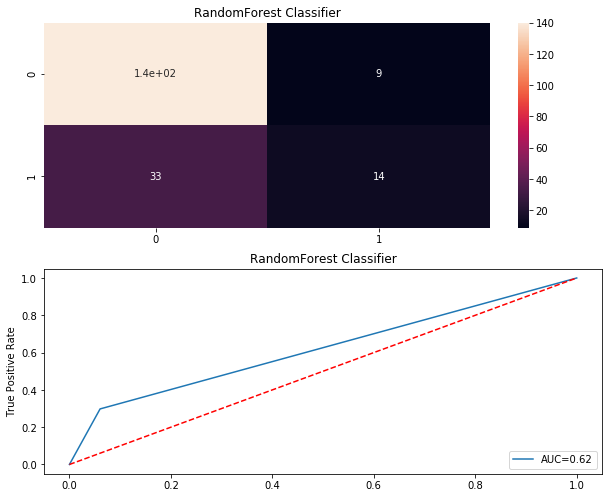

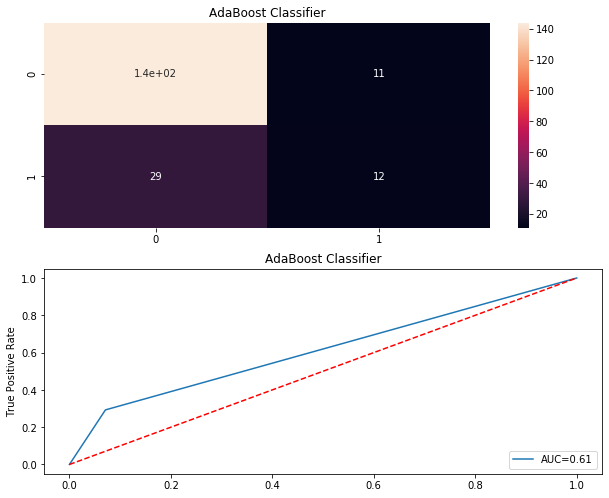

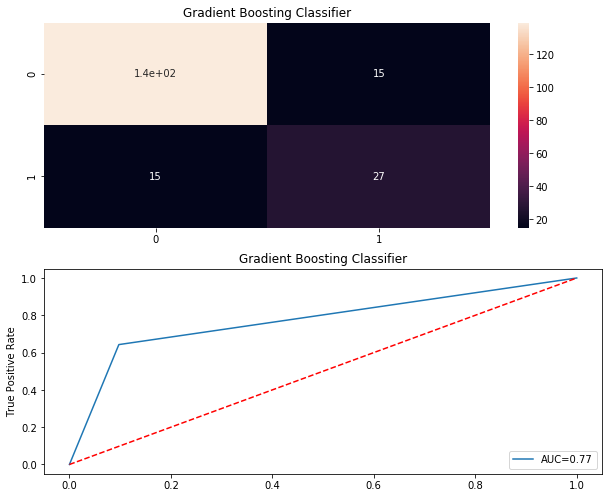

In [191]:
for name,model,randomstate in models:
    print('***********',name,'************')
    print('\n')
    Models.append(name)
    xtrain,xtest,ytrain,ytest=train_test_split(x,y,random_state=randomstate,test_size=0.20)
    model.fit(xtrain,ytrain)
    print(model)
    pred=model.predict(xtest)
    print('\n')
    Ac=accuracy_score(ytest,pred)
    print('Accuracy score=',Ac)
    Accuracy.append(Ac*100)
    print('\n')
    cvs=cross_val_score(model,x,y,cv=5,scoring='accuracy').mean()
    print('Cross Validation Score=',cvs)
    Cvs.append(cvs)
    print('\n')
    Cr=classification_report(ytest,pred)
    print(Cr)
    print('\n')
    cm=confusion_matrix(ytest,pred)
    print(cm)
    fpr,tpr,threshold=roc_curve(ytest,pred)
    roc_auc=auc(fpr,tpr)
    print('Roc score=',roc_auc)
    Roc_score.append(roc_auc)
    print('\n')
    
    plt.figure(figsize=(10,40))
    plt.subplot(911)
    plt.title(name)
    print(sns.heatmap(cm,annot=True))
    plt.subplot(912)
    plt.title(name)
    plt.plot(fpr,tpr,label='AUC=%0.2f'%roc_auc)
    plt.plot([0,1],[0,1],'r--')
    plt.legend(loc='lower right')
    plt.ylabel('True Positive Rate')
    
    print('\n\n')

In [192]:
Result=pd.DataFrame({'Models':Models,'Accuracy':Accuracy,'Cross Validation Score':Cvs,'Roc_Score':Roc_score})
Result

,Models,Accuracy,Cross Validation Score,Roc_Score
0,Logistic Regression,82.142857,0.775510,0.711378
1,Support Vector Classifier,82.653061,0.775510,0.686304
2,KNeighborsClassifier,80.102041,0.741837,0.536809
3,Decision tree Classifier,83.163265,0.773469,0.754329
4,RandomForest Classifier,78.571429,0.768367,0.618735
5,AdaBoost Classifier,79.591837,0.771429,0.610858
6,Gradient Boosting Classifier,84.693878,0.821429,0.772727


Gradient boosting classifier is the best model

In [193]:
#saving the model
from sklearn.externals import joblib
joblib.dump(gdb,'gdb.auto-fraud.obj')

['gdb.auto-fraud.obj']